In [1]:
import os
import io
import colorsys

import cv2 as cv
import numpy as np

from matplotlib import pyplot as plt
from PIL import Image as pil_image
from itertools import combinations

# Utilities

In [2]:
def imgs_show(imgs, rows, fontsize=36):
    fig = plt.figure(figsize=(30, 10))
    for n, (img, title) in enumerate(imgs):
        a = fig.add_subplot(rows, np.ceil(len(imgs)/float(rows)), n + 1)
        a.set_title(title, fontdict={"fontsize": fontsize})
        plt.imshow(img)
    fig.set_size_inches(np.array(fig.get_size_inches()) * len(imgs))
    plt.show()

def read_folder(folder, ext):
    images = []
    for filename in sorted(os.listdir(folder)):
        if filename.endswith(ext):
            path = os.path.join(folder, filename)
            images.append(np.array(pil_image.open(path)))
    return images

def img_show(img, title = '', figsize=(10, 5)):
    plt.figure(figsize=figsize)
    plt.gray()
    plt.imshow(img)
    plt.title(title)
    plt.show()
    
def hsv2rgb(h, s, v):
    return tuple(round(i * 255) for i in colorsys.hsv_to_rgb(h/255, s/255, v/255))
    
def generate_palette(n):
    return [hsv2rgb(i, 255, 255) for i in range(0, 360, 360//n)]
    
def draw_points(img, pts):
    cp = np.copy(img)
    palette = generate_palette(len(pts))
    for i, (y, x) in enumerate(pts):
        cv.circle(cp, (y, x), 4, palette[i], -1)
    return cp

# Multiple view geometry

[OpenCV tutorial](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_calib3d/py_epipolar_geometry/py_epipolar_geometry.html#epipolar-geometry)

Images are taken from [this repo](https://github.com/s-e-r-g-y/computer-vision-assignment-4) since I didn't take pictures of [Sheptytsky Center](https://center.ucu.edu.ua/en/main-page/) on my own.

In [33]:
imgs = read_folder('./building/', '.jpg')

pts = np.array([
    [
        (415, 110), (410, 195), (455, 200), (445, 275), 
        (330, 285), (190, 230), (150, 245), (140, 370)
    ],
    [
        (700, 255), (700, 300), (730, 320), (750, 365), 
        (525, 320), (365, 195), (460, 235), (460, 390)
    ],
    [
        (650, 285), (650, 325), (665, 345), (680, 380), 
        (570, 335), (490, 215), (570, 255), (575, 390)
    ],
])

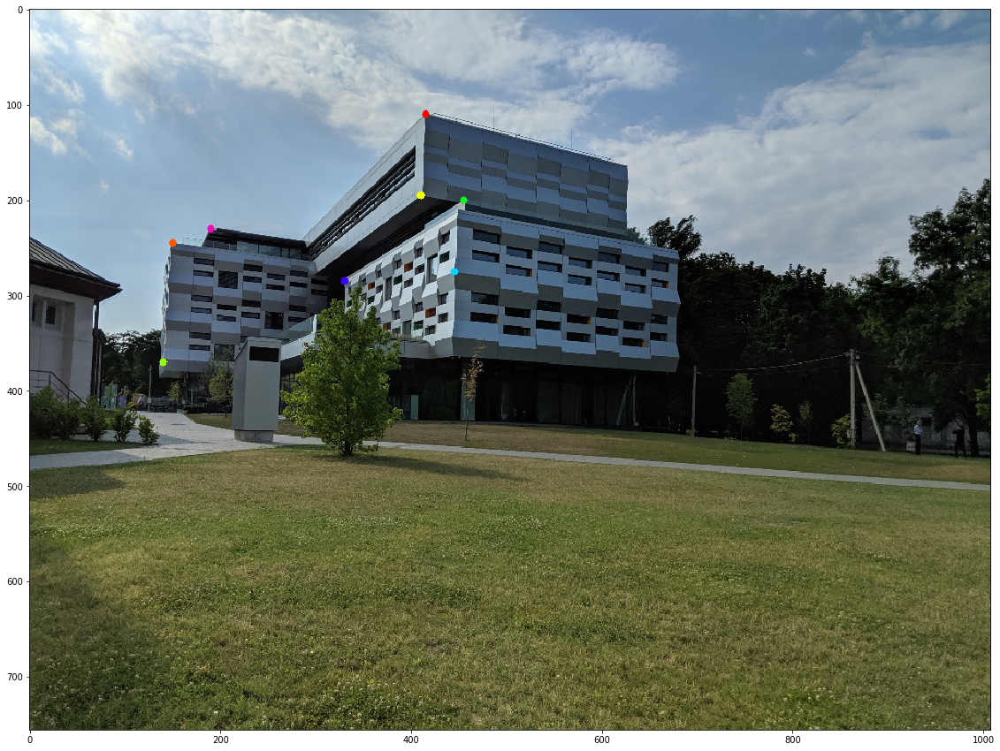

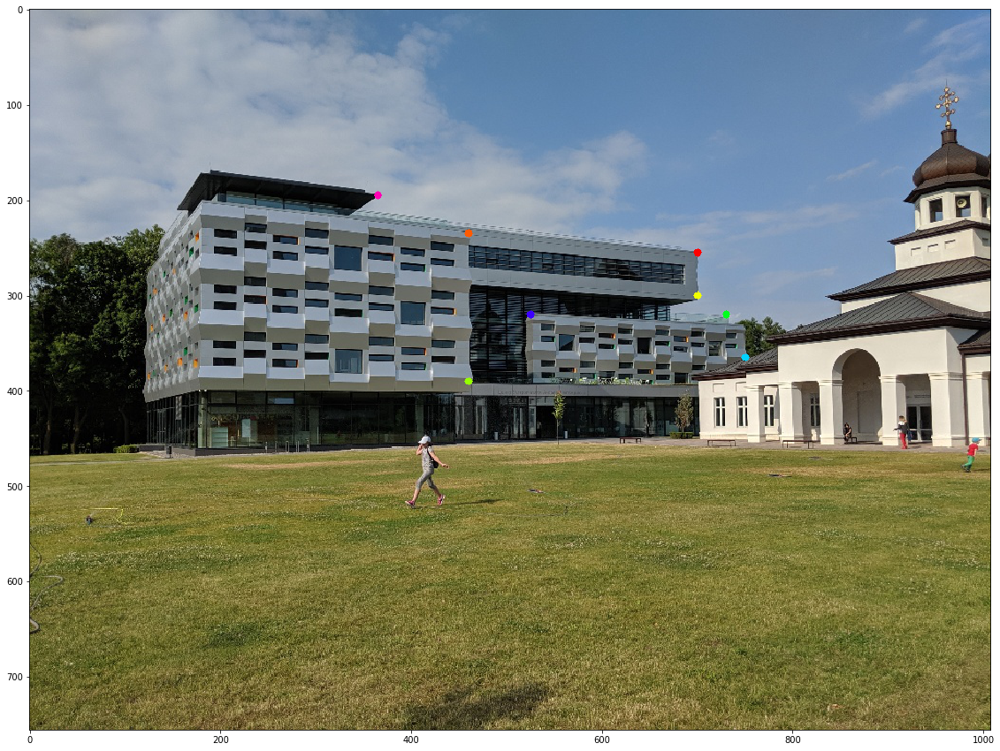

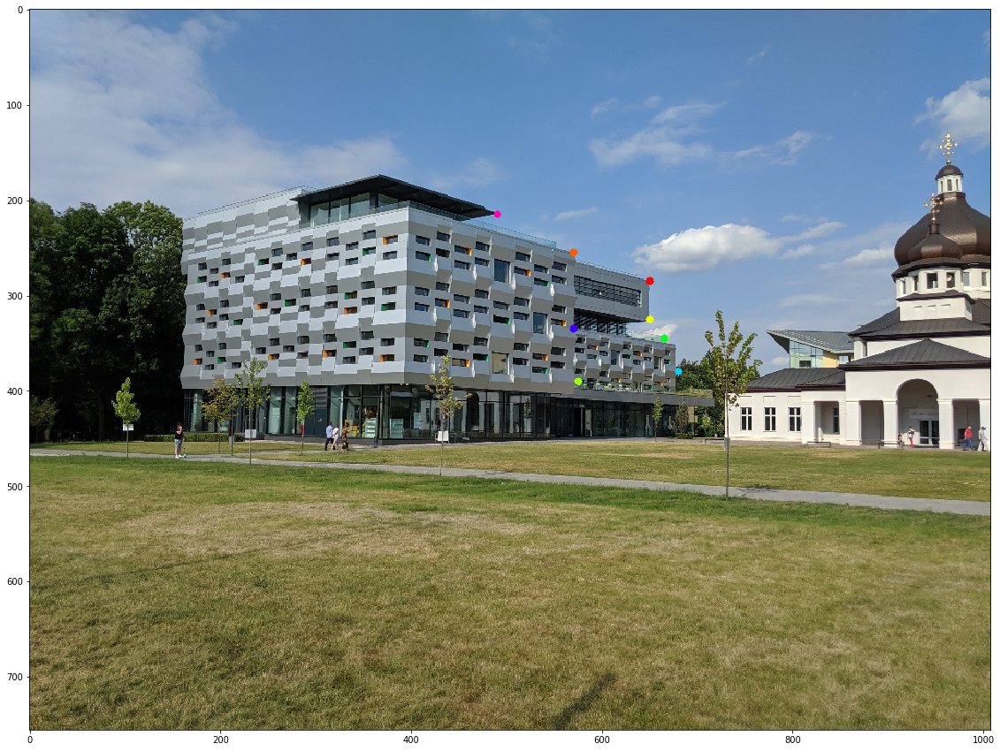

In [34]:
for i, img in enumerate(imgs):
    img_show(draw_points(img, pts[i]), figsize=(30, 15))

In [35]:
class EpipolarGeometry:
    def __init__(self, img1, img2, pts1, pts2):
        self.img1 = img1
        self.img2 = img2
        self.pts1 = np.int32(pts1)
        self.pts2 = np.int32(pts2)
        self.lines1 = None
        self.lines2 = None
        self.F1 = None
        self.F2 = None
    
    def get_points(self):
        return self.pts1, self.pts2
        
    def find_matrix(self):
        self.F1, mask = cv.findFundamentalMat(self.pts1, self.pts2, cv.FM_8POINT)
        self.pts1 = self.pts1[mask.ravel() == 1]
        return self.F1
    
    def find_lines(self):
        lines1 = cv.computeCorrespondEpilines(self.pts2.reshape(-1, 1, 2), 2, self.F1)
        self.lines1 = lines1.reshape(-1, 3)
        
        lines2 = cv.computeCorrespondEpilines(self.pts1.reshape(-1, 1, 2), 2, self.F1)
        self.lines2 = lines2.reshape(-1, 3)
        
        return self.lines1, self.lines2
    
    @staticmethod
    def drawlines(img1, img2, lines, pts1, pts2):
        r, c = img1.shape[:2]
        colors = generate_palette(len(pts1))
        for i, (r, pt1, pt2) in enumerate(zip(lines, pts1, pts2)):
            color = colors[i]
            x0, y0 = map(int, [0, -r[2] / r[1] ])
            x1, y1 = map(int, [c, -(r[2] + r[0] * c)/ r[1] ])
            img1 = cv.line(img1, (x0, y0), (x1, y1), color, 2)
        return img1
    
    @staticmethod
    def run(img1, img2, pts1, pts2):
        eg = EpipolarGeometry(img1, img2, pts1, pts2)
        eg.find_matrix()
        l1, l2 = eg.find_lines()
        p1, p2 = eg.get_points()
        result = EpipolarGeometry.drawlines(np.copy(img1), np.copy(img2), l1, p1, p2)
        return result

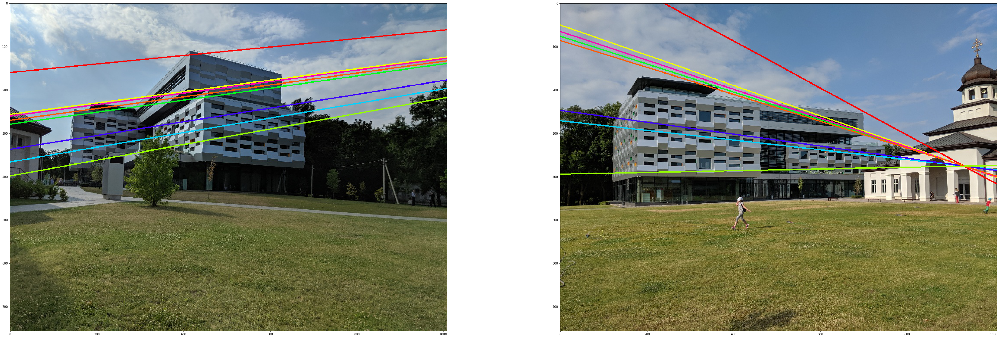

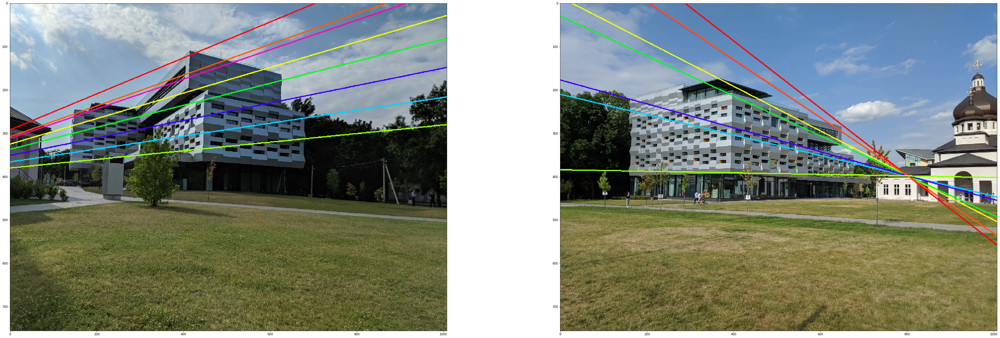

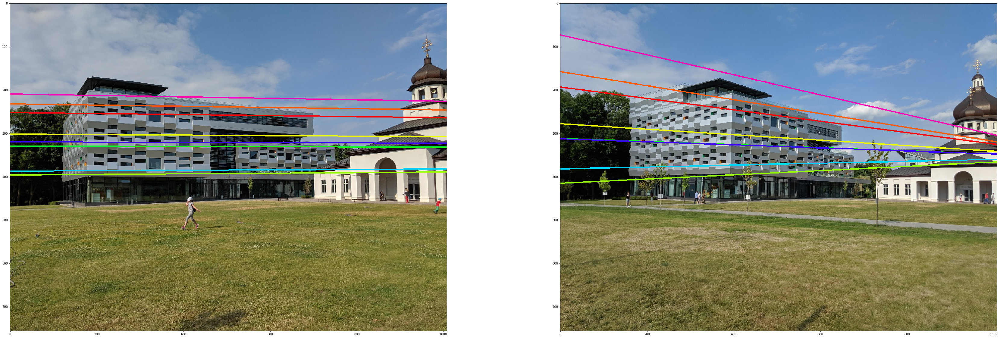

In [36]:
perm = combinations([(imgs[i], pts[i]) for i in range(len(imgs))], 2)

for ((img1, pts1), (img2, pts2)) in perm:
    result1 = EpipolarGeometry.run(img1, img2, pts1, pts2)
    result2 = EpipolarGeometry.run(img2, img1, pts2, pts1)
    imgs_show([(result1, ""), (result2, "")], 1)